<a href="https://colab.research.google.com/github/ManasUbhare/ML-PROJECTS/blob/main/YOLOV9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Wed Jun 26 12:09:21 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import torch

# Check PyTorch GPU availability
if torch.cuda.is_available():
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
    print(f"GPU Is Available: {torch.cuda.is_available()}")
else:
    print("GPU is not available.")

GPU Name: Tesla T4
GPU Is Available: True


In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [4]:
!git clone https://github.com/WongKinYiu/yolov9.git
%cd yolov9
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 781, done.
remote: Counting objects: 100% (407/407), done.
remote: Compressing objects: 100% (168/168), done.
remote: Total 781 (delta 279), reused 278 (delta 227), pack-reused 374
Receiving objects: 100% (781/781), 3.30 MiB | 27.69 MiB/s, done.
Resolving deltas: 100% (324/324), done.
/content/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 55.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 48.2 MB/s eta 0:00:00


In [6]:
!pip install -q roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 1.5 MB/s eta 0:00:00


In [7]:
import roboflow

from IPython.display import Image

In [8]:
!mkdir -p {HOME}/weights

In [9]:
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt

In [10]:
!ls -la {HOME}/weights

total 402440
drwxr-xr-x 2 root root      4096 Jun 26 12:13 .
drwxr-xr-x 1 root root      4096 Jun 26 12:13 ..
-rw-r--r-- 1 root root  51508261 Feb 18 12:36 gelan-c.pt
-rw-r--r-- 1 root root 117203713 Feb 18 12:36 gelan-e.pt
-rw-r--r-- 1 root root 103153312 Feb 18 12:36 yolov9-c.pt
-rw-r--r-- 1 root root 140217688 Feb 18 12:36 yolov9-e.pt


In [11]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ntGbxAUzMkCMFPq89gjM")
project = rf.workspace("alec-hantson-student-howest-be").project("carla-izloa")
version = project.version(20)
dataset = version.download("yolov9")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to CARLA-20 in yolov9:: 100%|██████████| 3737/3737 [00:00<00:00, 8922.36it/s]


TRAINING CUSTOM MODEL

In [13]:
%cd {HOME}/yolov9

!python train.py \
--batch 16 --epochs 15 --img 640 --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-06-26 12:17:13.209023: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-26 12:17:13.209075: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-26 12:17:13.210581: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-26 12:17:13.217918: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-26 12:17:14.528731: W

In [14]:
!ls {HOME}/yolov9/runs/train/exp2/

confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1719404235.46c476bdbe14.2496.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


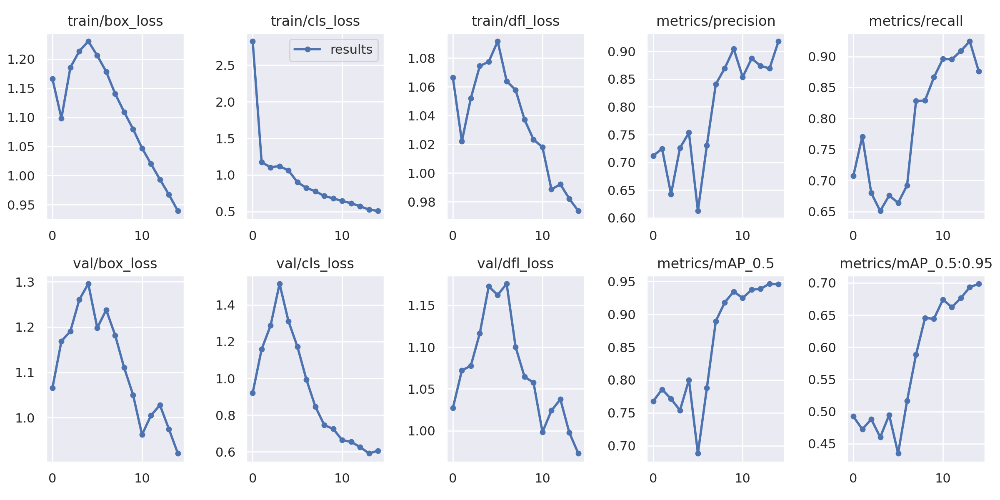

In [15]:
Image(filename=f"{HOME}/yolov9/runs/train/exp2/results.png", width=1000)

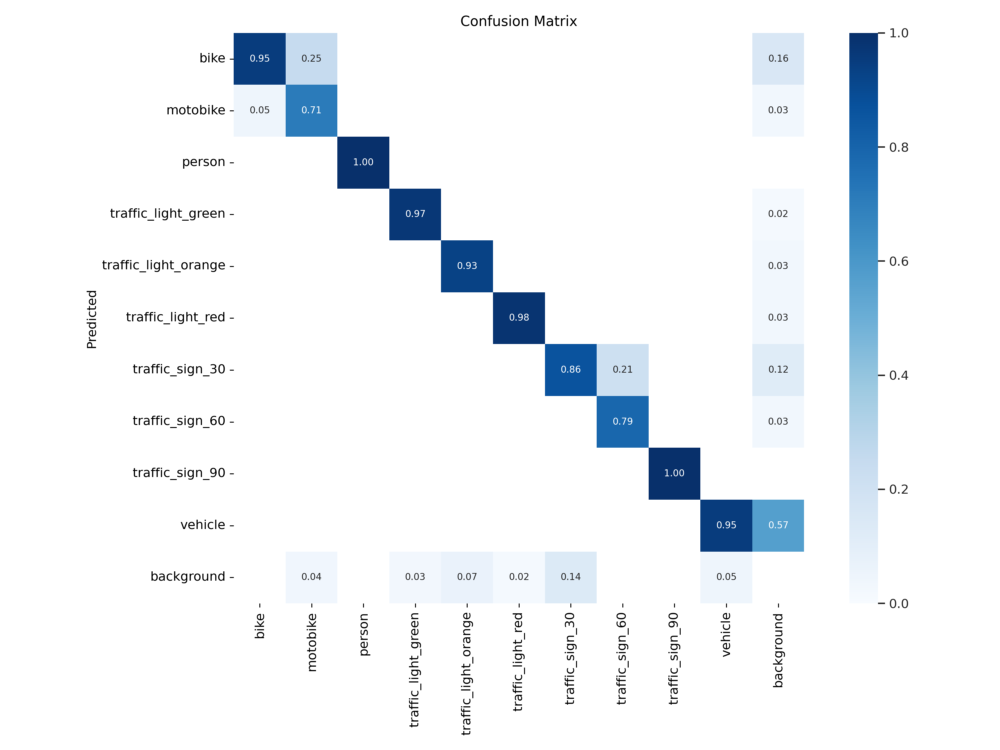

In [16]:
Image(filename=f"{HOME}/yolov9/runs/train/exp2/confusion_matrix.png", width=1000)

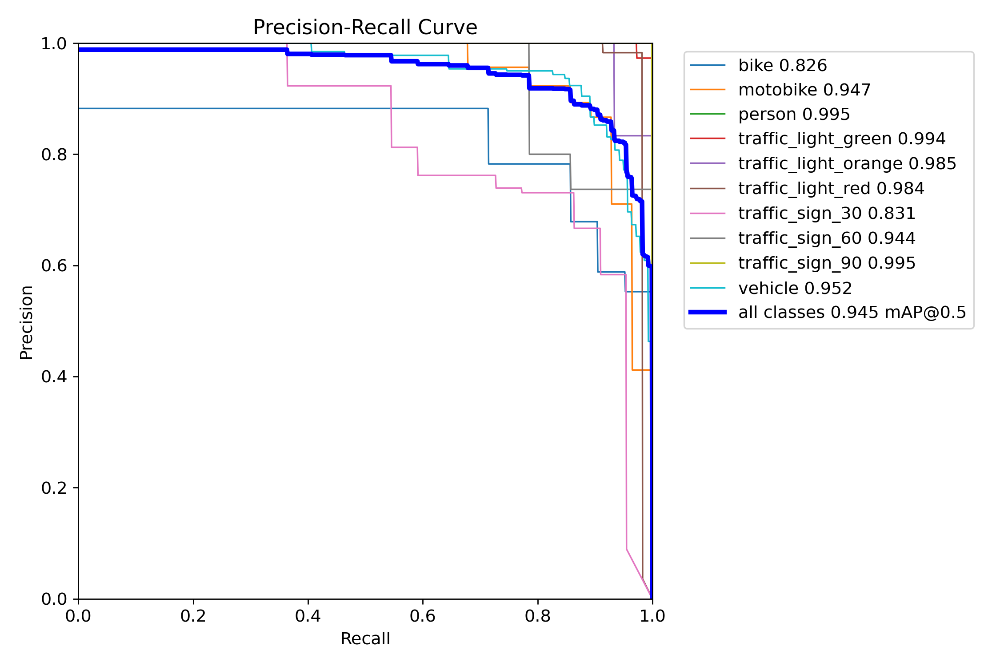

In [17]:
Image(filename=f"{HOME}/yolov9/runs/train/exp2/PR_curve.png", width=1000)

validating custom models

In [18]:
%cd {HOME}/yolov9

!python val.py \
--img 640 --batch 8 --conf 0.001 --iou 0.7 --device 0 \
--data {dataset.location}/data.yaml \
--weights {HOME}/yolov9/runs/train/exp2/weights/best.pt

/content/yolov9
val: data=/content/yolov9/CARLA-20/data.yaml, weights=['/content/yolov9/runs/train/exp2/weights/best.pt'], batch_size=8, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 387 layers, 25234798 parameters, 0 gradients, 101.8 GFLOPs
val: Scanning /content/yolov9/CARLA-20/valid/labels.cache... 264 images, 69 backgrounds, 0 corrupt: 100% 264/264 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 33/33 [00:08<00:00,  3.97it/s]
                   all        264        363      0.921      0.876      0.945      0.699
                  bike        264         21      0.6

In [19]:
%cd {HOME}/yolov9

!python train.py \
--batch 16 --epochs 15 --img 640 --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-06-26 12:43:20.565332: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-26 12:43:20.565395: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-26 12:43:20.567329: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-26 12:43:20.578031: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-26 12:43:22.205978: W

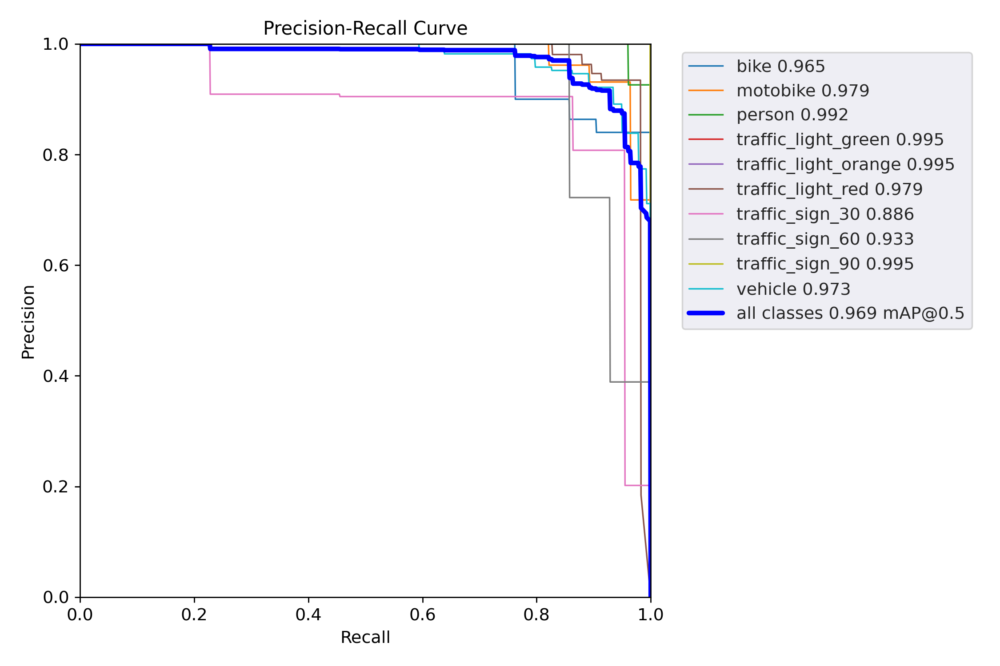

In [20]:
Image(filename=f"{HOME}/yolov9/runs/train/exp3/PR_curve.png", width=1000)

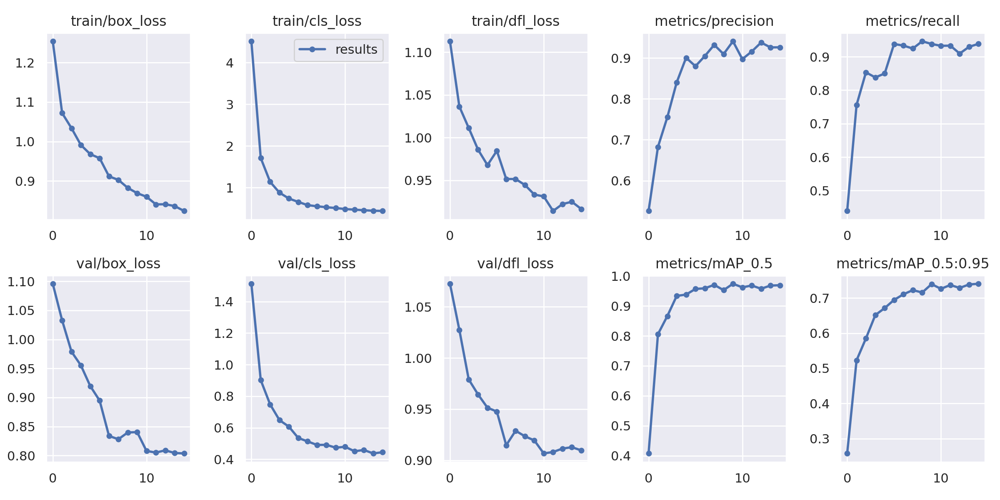

In [21]:
Image(filename=f"{HOME}/yolov9/runs/train/exp3/results.png", width=1000)

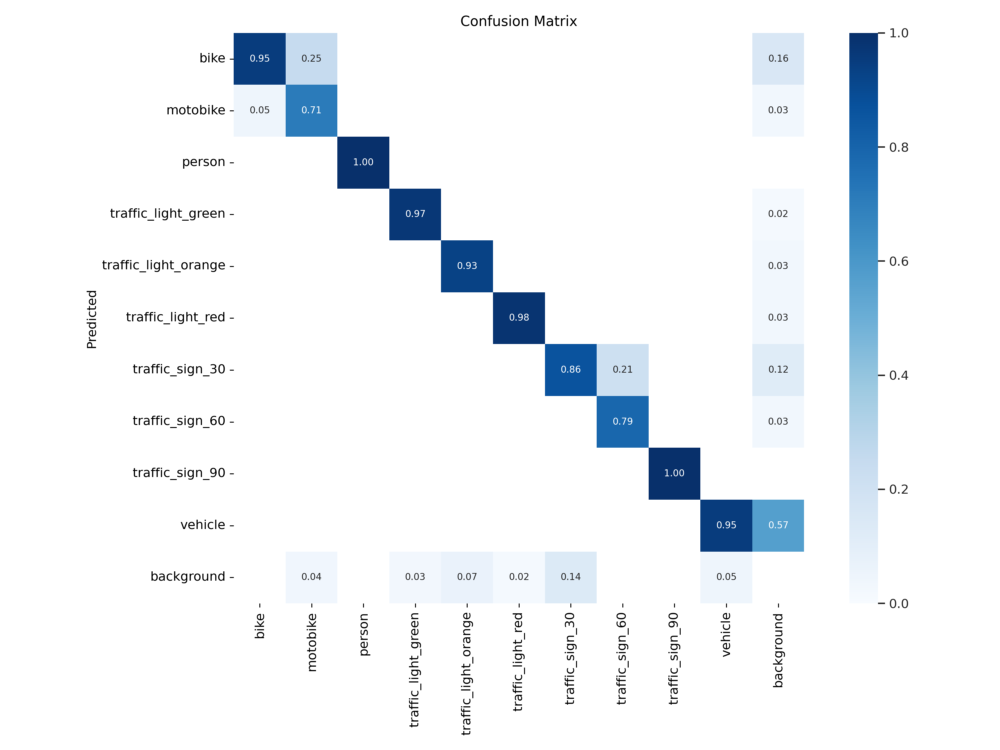

In [22]:
Image(filename=f"{HOME}/yolov9/runs/train/exp2/confusion_matrix.png", width=1000)

In [23]:
%cd {HOME}/yolov9

!python train.py \
--batch 16 --epochs 15 --img 640 --device 0 --min-items 0 --close-mosaic 15 --optimizer Adam \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-06-26 13:13:22.530981: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-26 13:13:22.531029: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-26 13:13:22.532566: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-26 13:13:22.540114: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-26 13:13:23.762165: W

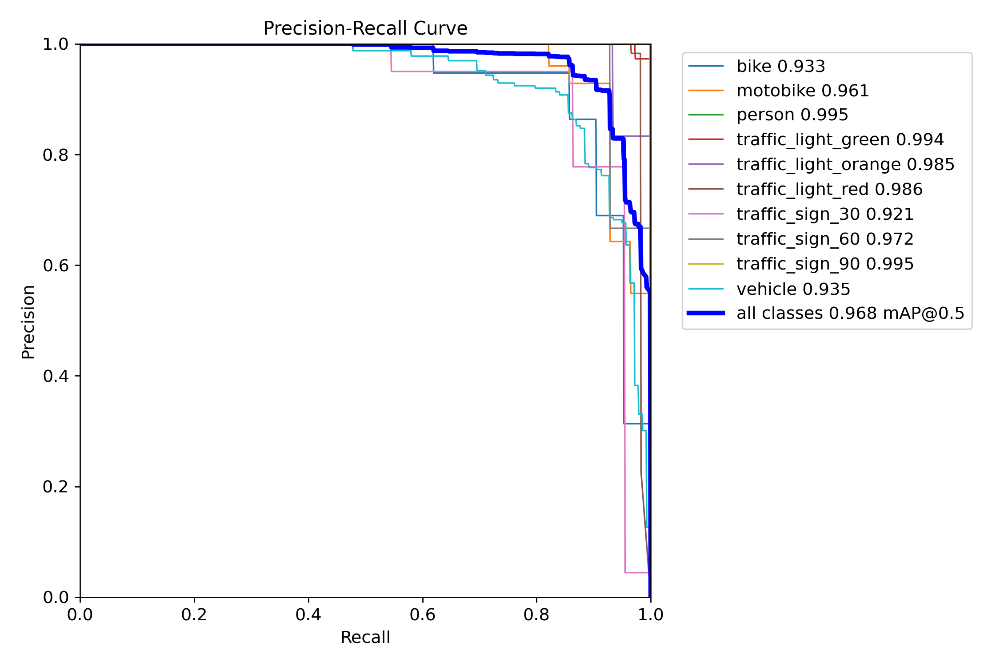

In [24]:
Image(filename=f"{HOME}/yolov9/runs/train/exp4/PR_curve.png", width=1000)

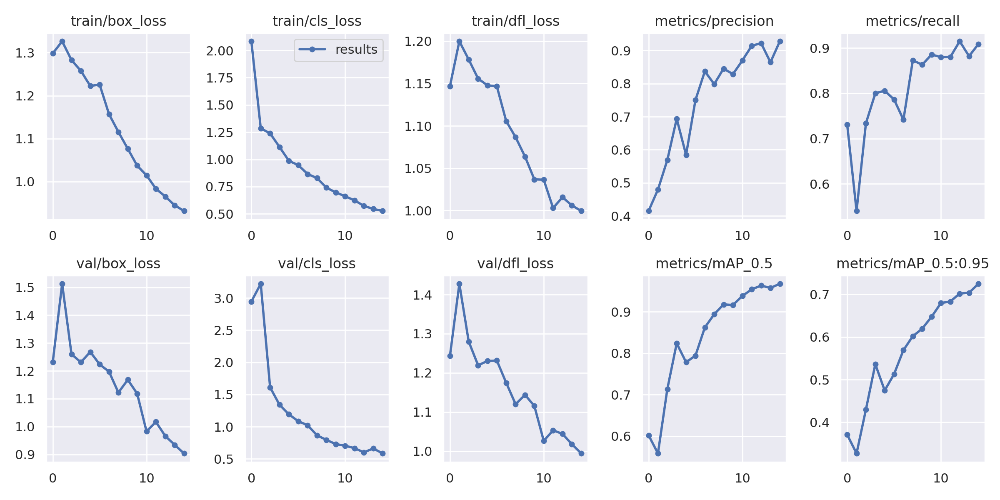

In [25]:
Image(filename=f"{HOME}/yolov9/runs/train/exp4/results.png", width=1000)

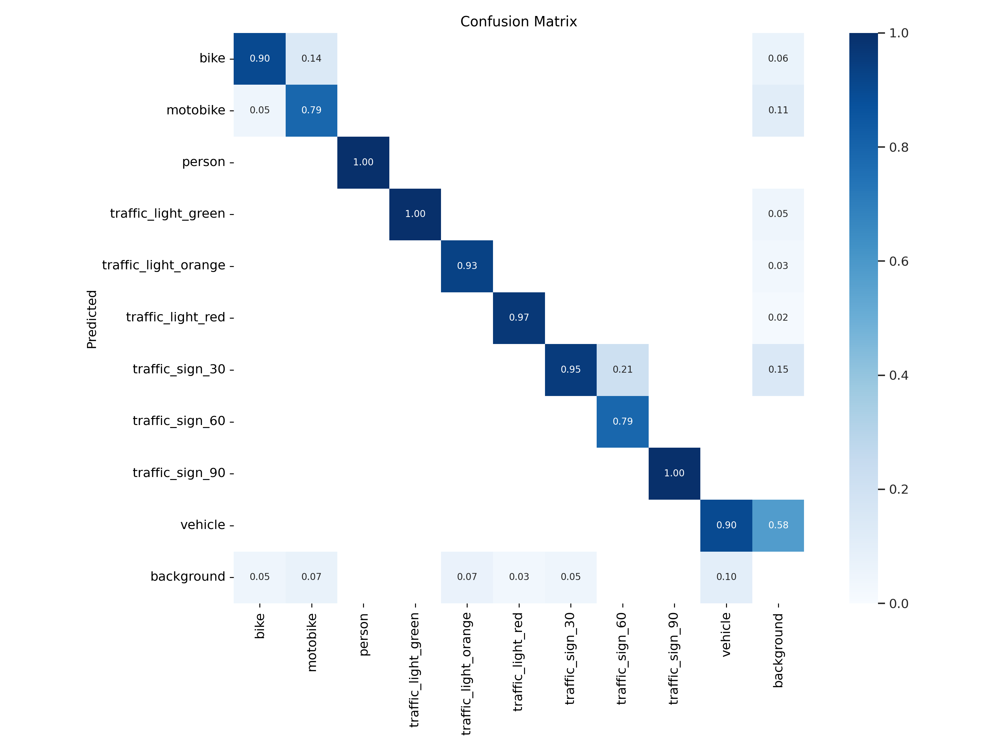

In [26]:
Image(filename=f"{HOME}/yolov9/runs/train/exp4/confusion_matrix.png", width=1000)

In [28]:
%cd {HOME}/yolov9

!python train.py \
--batch 16 --epochs 15 --img 640 --device 0 --min-items 0 --close-mosaic 15 --optimizer AdamW \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-06-26 13:39:11.696353: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-26 13:39:11.696410: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-26 13:39:11.697720: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-26 13:39:11.704754: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-26 13:39:12.903086: W

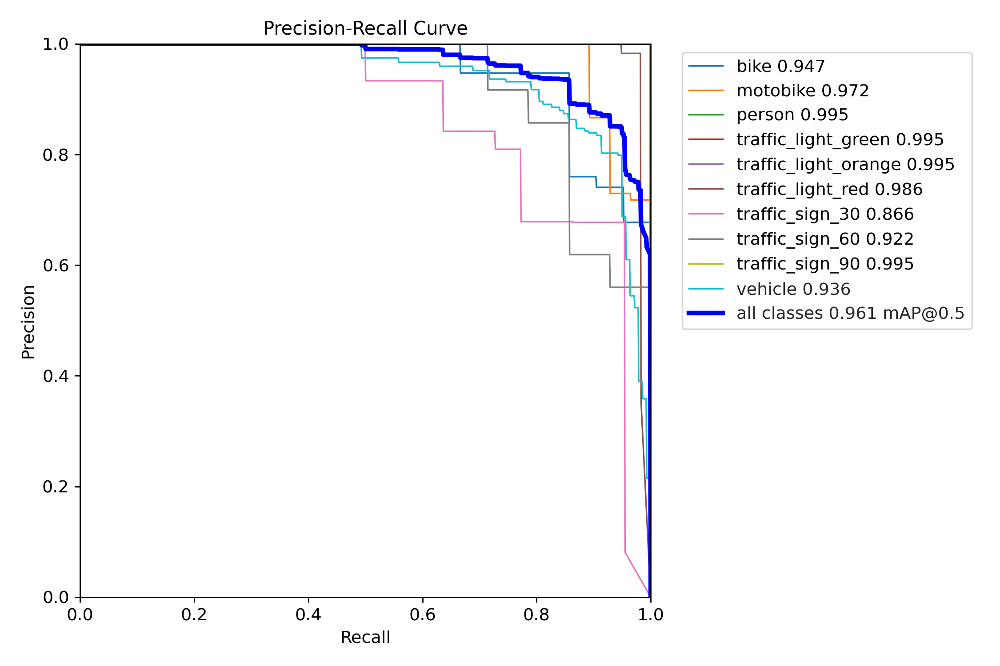

In [29]:
Image(filename=f"{HOME}/yolov9/runs/train/exp5/PR_curve.png", width=1000)

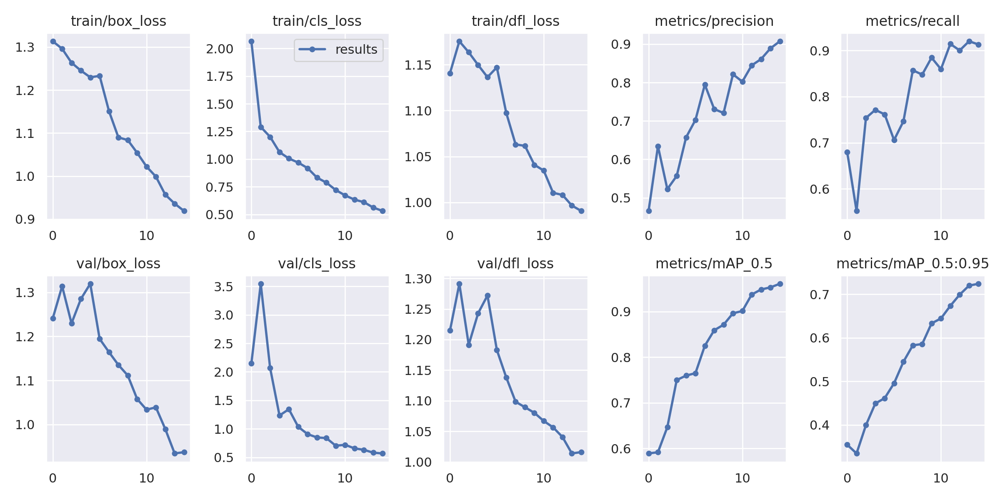

In [30]:
Image(filename=f"{HOME}/yolov9/runs/train/exp5/results.png", width=1000)

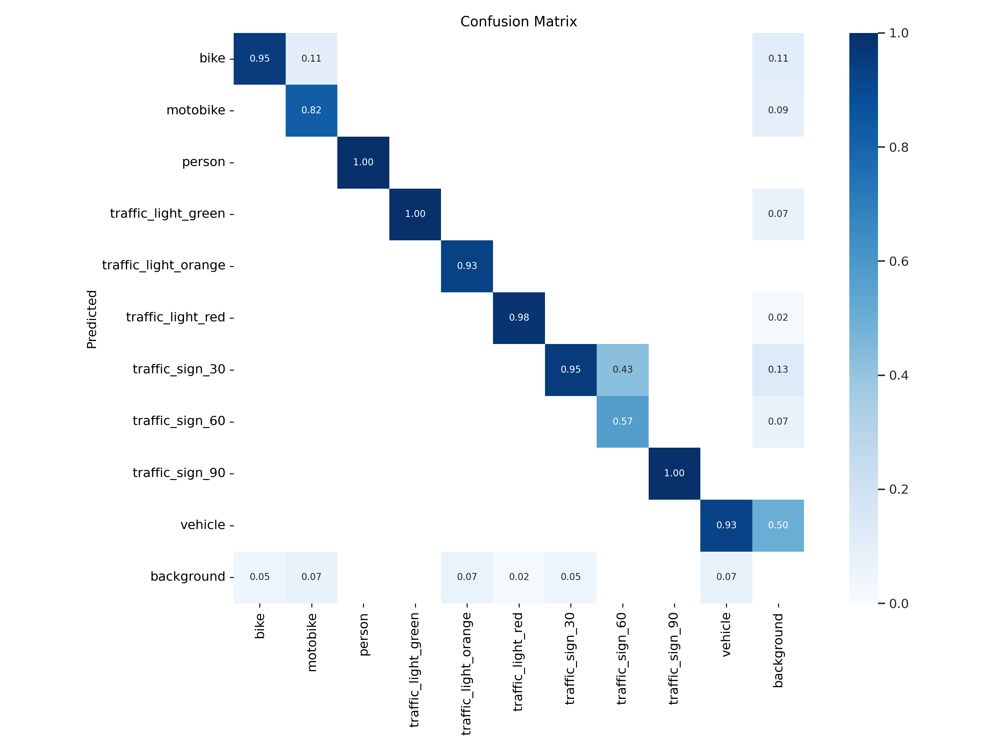

In [31]:
Image(filename=f"{HOME}/yolov9/runs/train/exp5/confusion_matrix.png", width=1000)

In [32]:
%cd {HOME}/yolov9

!python train.py \
--batch 16 --epochs 15 --img 640 --device 0 --min-items 0 --close-mosaic 15 --optimizer LION \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-06-26 14:09:09.017389: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-26 14:09:09.017452: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-26 14:09:09.018945: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-26 14:09:09.026515: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-26 14:09:10.250917: W

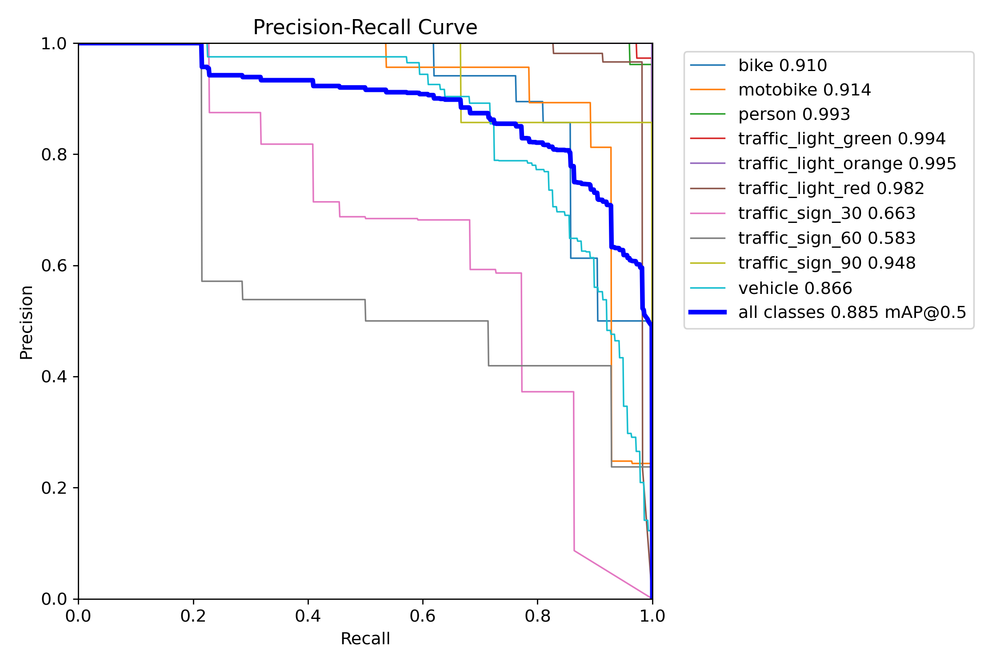

In [33]:
Image(filename=f"{HOME}/yolov9/runs/train/exp6/PR_curve.png", width=1000)

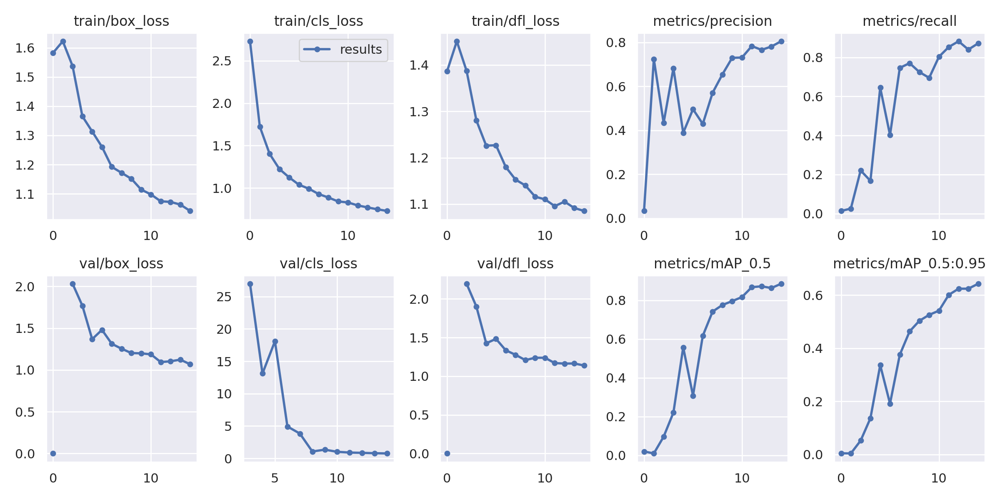

In [34]:
Image(filename=f"{HOME}/yolov9/runs/train/exp6/results.png", width=1000)

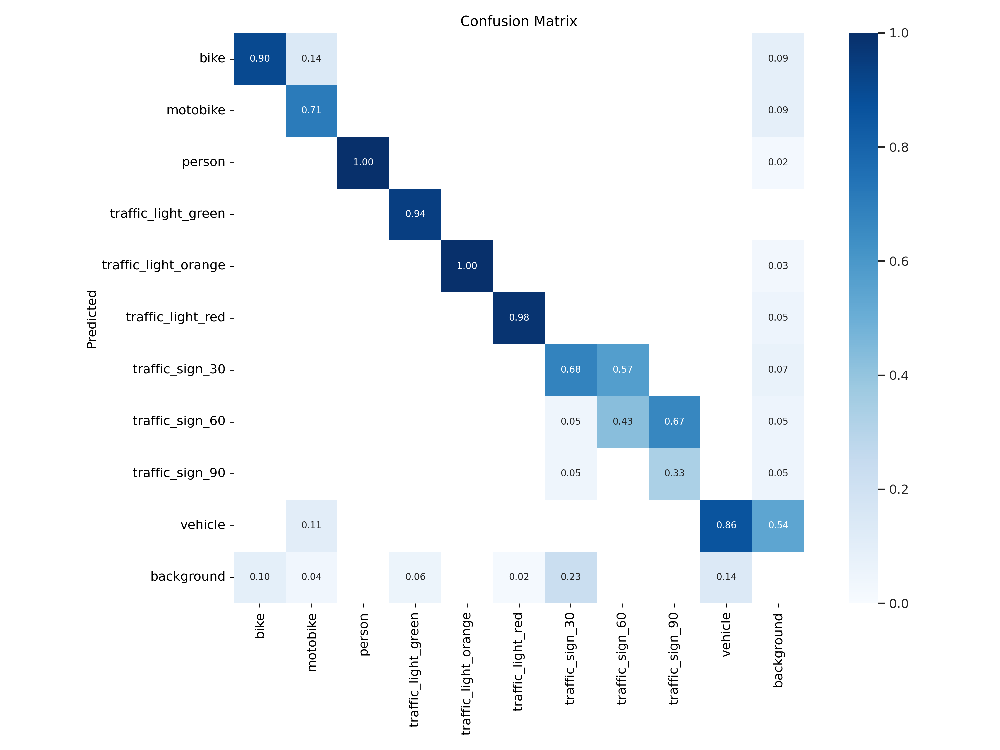

In [35]:
Image(filename=f"{HOME}/yolov9/runs/train/exp6/confusion_matrix.png", width=1000)

In [36]:
%cd {HOME}/yolov9

!python train.py \
--batch 16 --epochs 15 --img 640 --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-06-26 14:44:33.459791: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-26 14:44:33.459836: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-26 14:44:33.461395: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-26 14:44:33.468723: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-26 14:44:34.695712: W

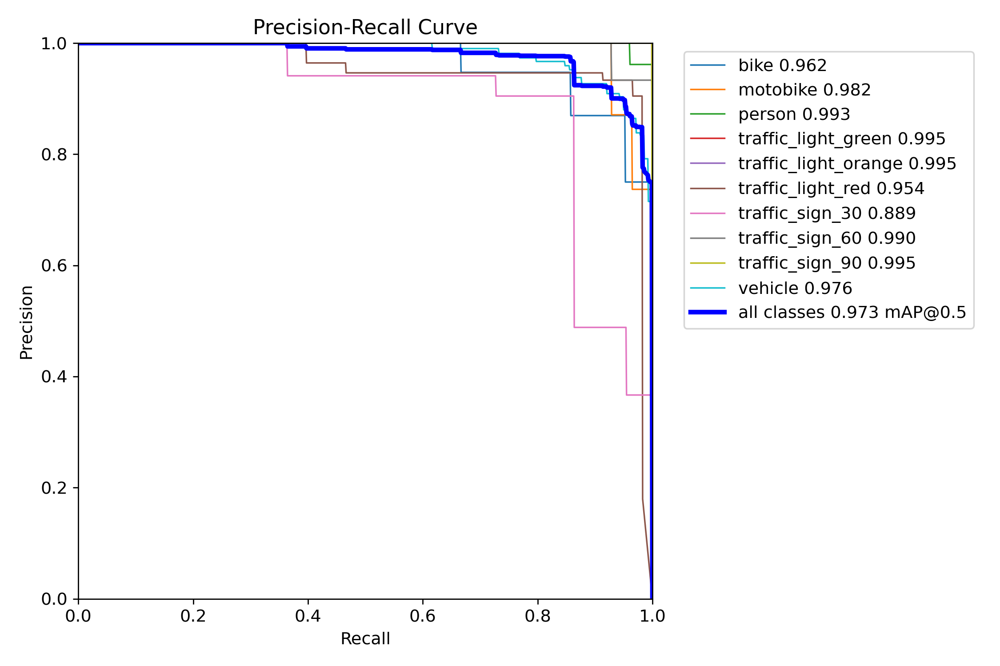

In [37]:
Image(filename=f"{HOME}/yolov9/runs/train/exp7/PR_curve.png", width=1000)

Inference with custom model


In [38]:
!python detect.py \
--img 640 --conf 0.1 --device 0 \
--weights {HOME}/yolov9/runs/train/exp7/weights/best.pt \
--source /content/ss4.png

detect: weights=['/content/yolov9/runs/train/exp7/weights/best.pt'], source=/content/ss4.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 387 layers, 25234798 parameters, 0 gradients, 101.8 GFLOPs
image 1/1 /content/ss4.png: 384x640 34 vehicles, 111.2ms
Speed: 0.5ms pre-process, 111.2ms inference, 591.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


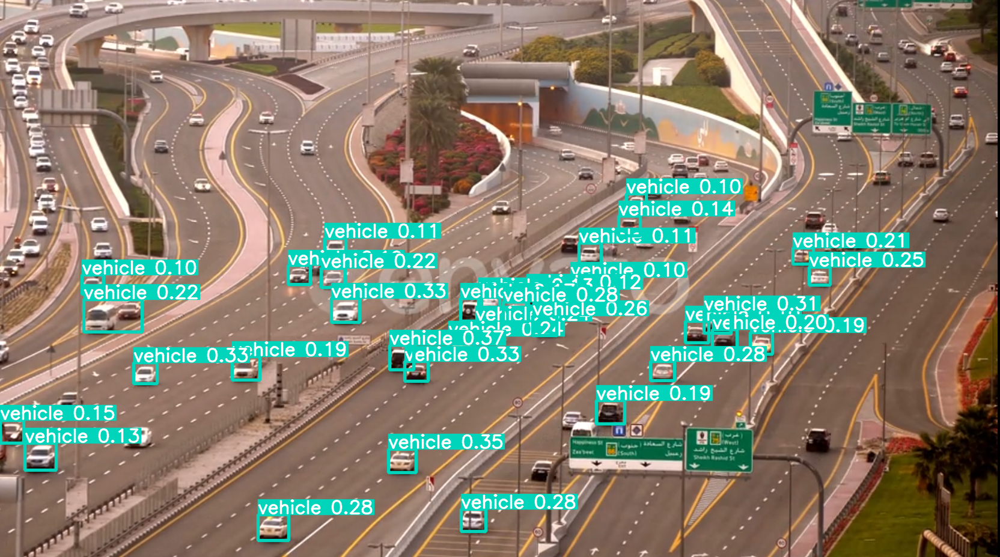

In [39]:
Image(filename=f"/content/yolov9/runs/detect/exp/ss4.png", width=600)

In [40]:
!python detect.py \
--img 640 --conf 0.1 --device 0 \
--weights {HOME}/yolov9/runs/train/exp3/weights/best.pt \
--source /content/ss4.png

detect: weights=['/content/yolov9/runs/train/exp3/weights/best.pt'], source=/content/ss4.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 387 layers, 25234798 parameters, 0 gradients, 101.8 GFLOPs
image 1/1 /content/ss4.png: 384x640 28 vehicles, 114.3ms
Speed: 0.5ms pre-process, 114.3ms inference, 582.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


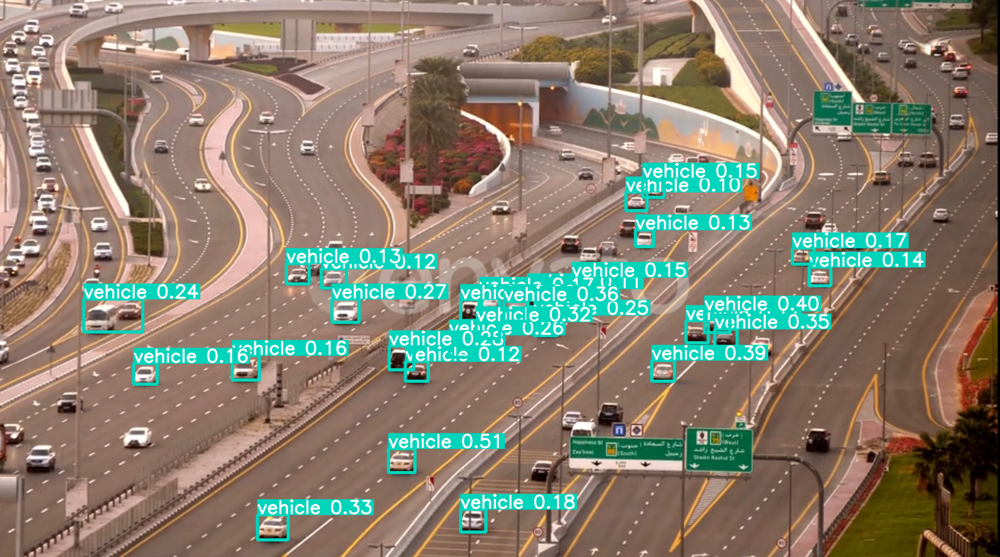

In [41]:
Image(filename=f"/content/yolov9/runs/detect/exp2/ss4.png", width=600)

In [42]:
!python detect.py \
--img 640 --conf 0.1 --device 0 \
--weights {HOME}/yolov9/runs/train/exp2/weights/best.pt \
--source /content/ss4.png

detect: weights=['/content/yolov9/runs/train/exp2/weights/best.pt'], source=/content/ss4.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 387 layers, 25234798 parameters, 0 gradients, 101.8 GFLOPs
image 1/1 /content/ss4.png: 384x640 2 vehicles, 109.7ms
Speed: 0.5ms pre-process, 109.7ms inference, 573.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


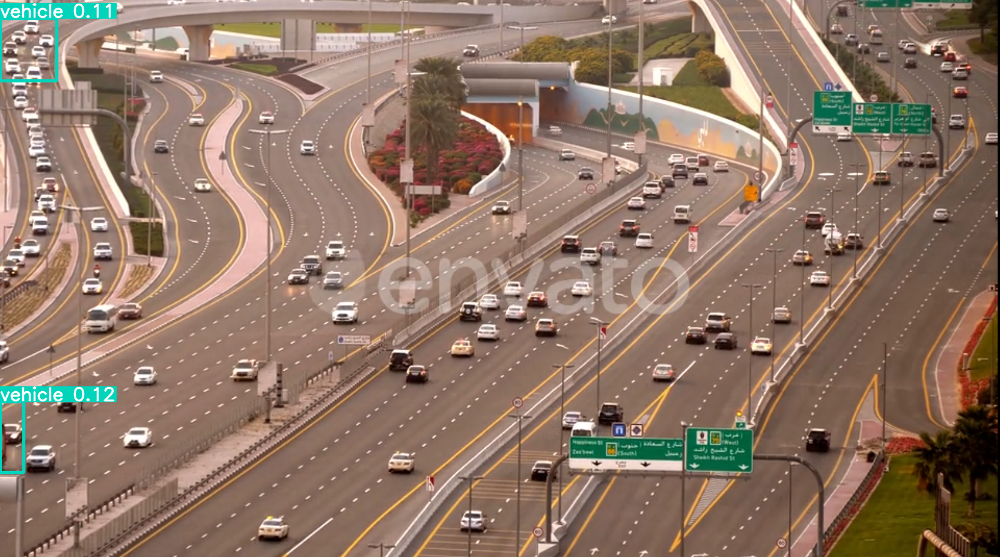

In [43]:
Image(filename=f"/content/yolov9/runs/detect/exp3/ss4.png", width=600)

In [44]:
!python detect.py \
--img 640 --conf 0.1 --device 0 \
--weights /content/weights/gelan-c.pt \
--source /content/ss4.png

detect: weights=['/content/weights/gelan-c.pt'], source=/content/ss4.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 387 layers, 25288768 parameters, 0 gradients, 102.1 GFLOPs
image 1/1 /content/ss4.png: 384x640 1 person, 79 cars, 2 trucks, 2 traffic lights, 166.2ms
Speed: 0.4ms pre-process, 166.2ms inference, 827.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


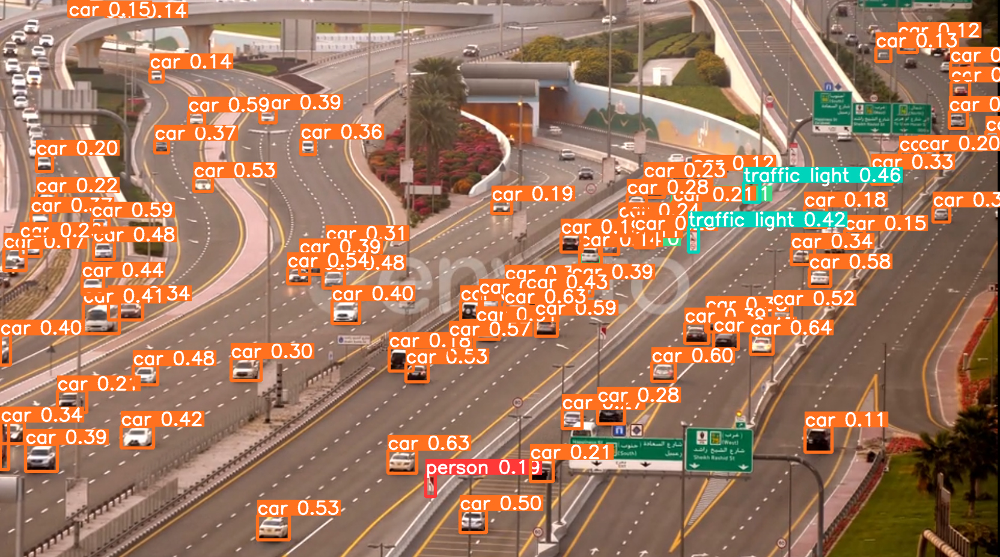

In [45]:
Image(filename=f"/content/yolov9/runs/detect/exp4/ss4.png", width=600)